<a href="https://colab.research.google.com/github/muhammadalfateh6/Skin-lesion-Classification-Deep-learning/blob/main/ResNet50_PH2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing Libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [30]:
%matplotlib inline

import os
import shutil
import random
import torch
import torchvision
import numpy as np

from PIL import Image
from matplotlib import pyplot as plt

torch.manual_seed(0)

print('Using PyTorch version', torch.__version__)

Using PyTorch version 1.13.1+cu116


# Preparing Training and Test Sets

In [31]:
class_names = ['Common', 'Atypical', 'Melanoma']
root_dir = '/content/drive/MyDrive/PH2 Ready'
source_dirs = ['/content/drive/MyDrive/PH2 Ready/0 - Common Nevus', '/content/drive/MyDrive/PH2 Ready/1 - Atypical Nevus', '/content/drive/MyDrive/PH2 Ready/2 - Melanoma']

if os.path.isdir(os.path.join(root_dir, source_dirs[1])):
    os.mkdir(os.path.join(root_dir, 'test'))

    for i, d in enumerate(source_dirs):
        os.rename(os.path.join(root_dir, d), os.path.join(root_dir, class_names[i]))

    for c in class_names:
        os.mkdir(os.path.join(root_dir, 'test', c))

    for c in class_names:
        images = [x for x in os.listdir(os.path.join(root_dir, c)) if x.lower().endswith('bmp')]
        selected_images = random.sample(images, 30)
        for image in selected_images:
            source_path = os.path.join(root_dir, c, image)
            target_path = os.path.join(root_dir, 'test', c, image)
            shutil.move(source_path, target_path)

# Creating Custom Dataset

In [32]:
class ChestXRayDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name]) if x[-3:].lower().endswith('bmp')]
            print(f'Found {len(images)} {class_name} examples')
            return images
        
        self.images = {}
        self.class_names = ['Common', 'Atypical', 'Melanoma']
        
        for class_name in self.class_names:
            self.images[class_name] = get_images(class_name)
            
        self.image_dirs = image_dirs
        self.transform = transform
        
    
    def __len__(self):
        return sum([len(self.images[class_name]) for class_name in self.class_names])
    
    
    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index % len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        image = Image.open(image_path).convert('RGB')
        return self.transform(image), self.class_names.index(class_name)

# Image Transformations

In [33]:
train_trans= torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])
])

test_trans = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])
])

# Prepare DataLoader

In [34]:
train_dirs = {
    'Common': '/content/drive/MyDrive/PH2 Ready/Common',
    'Atypical': '/content/drive/MyDrive/PH2 Ready/Atypical',
    'Melanoma': '/content/drive/MyDrive/PH2 Ready/Melanoma'
}
train_dataset= ChestXRayDataset(train_dirs, train_trans)

Found 79 Common examples
Found 80 Atypical examples
Found 80 Melanoma examples


In [35]:
test_dirs = {
    'Common': '/content/drive/MyDrive/PH2 Ready/test/Common',
    'Atypical': '/content/drive/MyDrive/PH2 Ready/test/Atypical',
    'Melanoma': '/content/drive/MyDrive/PH2 Ready/test/Melanoma'
}
test_dataset= ChestXRayDataset(test_dirs, test_trans)

Found 10 Common examples
Found 10 Atypical examples
Found 10 Melanoma examples


In [36]:
batch_size =6

dl_train = torch.utils.data.DataLoader(train_dataset, 
                                       batch_size=batch_size,
                                      shuffle=True)
dl_test =torch.utils.data.DataLoader(test_dataset,
                                      batch_size = batch_size,
                                     shuffle=True)
print('Numberr of Training batches', len(dl_train))
print('Number of test bactches', len(dl_test))

Numberr of Training batches 40
Number of test bactches 5


# Data Visualization

In [37]:
class_names = train_dataset.class_names


def show_images(images, labels, preds):
    plt.figure(figsize=(8, 4))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks=[], yticks=[])
        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] != labels[i]:
            col = 'red'
            
        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color=col)
    plt.tight_layout()
    plt.show()

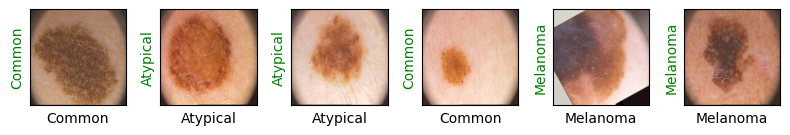

In [38]:
images, labels= next(iter(dl_train))
show_images(images, labels, labels)

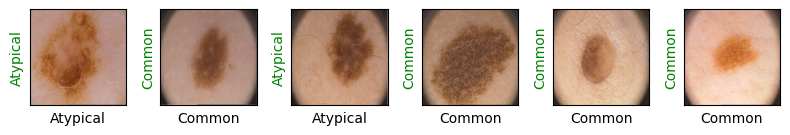

In [39]:
images, labels = next(iter(dl_test))
show_images(images, labels, labels)

# Creating the Model

In [40]:
model = torchvision.models.resnet18(pretrained =True)
print(model)

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [41]:
model.fc =torch.nn.Linear(in_features =512, out_features=3)
loss_fn =torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=3e-5)

In [42]:
def show_preds():
    model.eval()
    images, labels =next(iter(dl_test))
    outputs =model(images)
    _, preds = torch.max(outputs, 1)
    show_images(images, labels, preds)

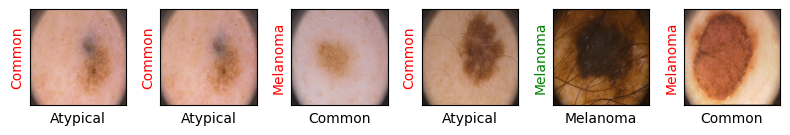

In [43]:
show_preds()

# Training the Model

In [45]:
def train(epochs):
    print('Starting training, Here we go')
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.

        model.train() # set model to training phase

        for train_step, (images, labels) in enumerate(dl_train):
            optimizer.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 20 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0

                model.eval() # set model to eval phase

                for val_step, (images, labels) in enumerate(dl_test):
                    outputs = model(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    accuracy += sum((preds == labels).numpy())

                val_loss /= (val_step + 1)
                accuracy = accuracy/len(test_dataset)
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

                show_preds()

                model.train()

                #if accuracy >= 0.95:
                 #   print('Performance condition satisfied. now i can rest for good..')
                  #  return

        train_loss /= (train_step + 1)

        print(f'Training Loss: {train_loss:.4f}')
    print('Training completed..')

Starting training, Here we go
Starting epoch 1/50
Evaluating at step 0
Validation Loss: 0.4533, Accuracy: 0.9333


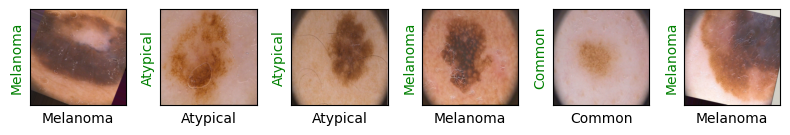

Evaluating at step 20
Validation Loss: 0.4544, Accuracy: 0.9000


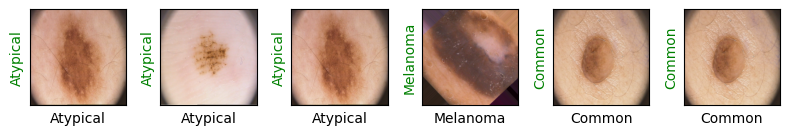

Training Loss: 0.6086
Starting epoch 2/50
Evaluating at step 0
Validation Loss: 0.3846, Accuracy: 0.8667


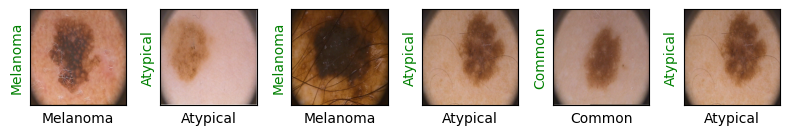

Evaluating at step 20
Validation Loss: 0.3114, Accuracy: 0.9667


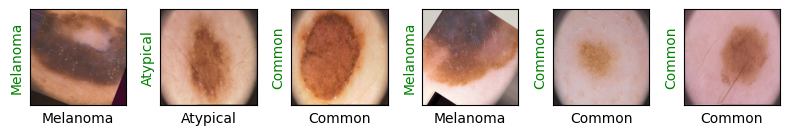

Training Loss: 0.4581
Starting epoch 3/50
Evaluating at step 0
Validation Loss: 0.2678, Accuracy: 0.9333


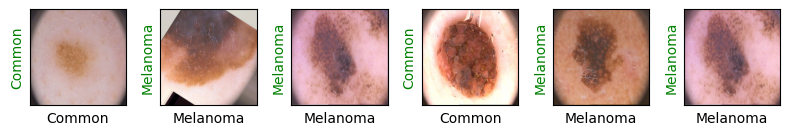

Evaluating at step 20
Validation Loss: 0.2369, Accuracy: 1.0000


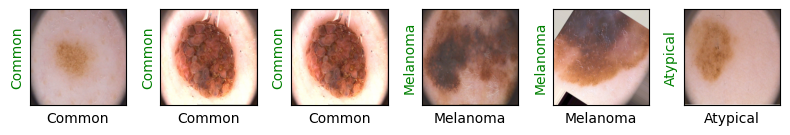

Training Loss: 0.3643
Starting epoch 4/50
Evaluating at step 0
Validation Loss: 0.1708, Accuracy: 1.0000


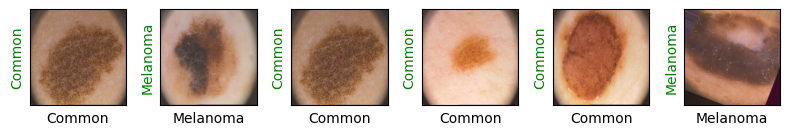

Evaluating at step 20
Validation Loss: 0.1800, Accuracy: 1.0000


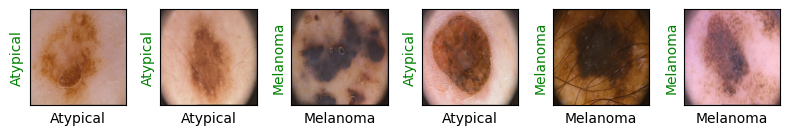

Training Loss: 0.3135
Starting epoch 5/50
Evaluating at step 0
Validation Loss: 0.1604, Accuracy: 0.9333


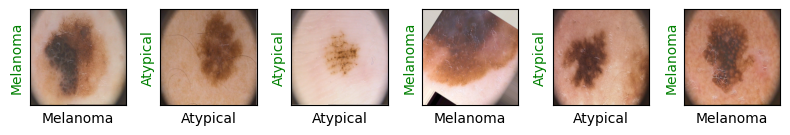

Evaluating at step 20
Validation Loss: 0.1058, Accuracy: 1.0000


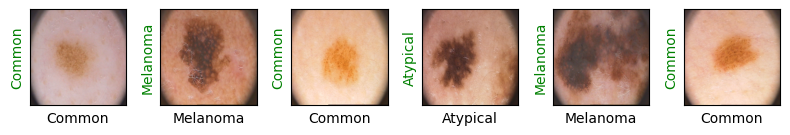

Training Loss: 0.2302
Starting epoch 6/50
Evaluating at step 0
Validation Loss: 0.0817, Accuracy: 0.9667


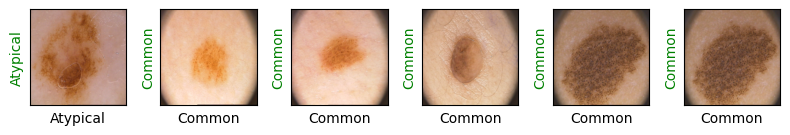

Evaluating at step 20
Validation Loss: 0.0755, Accuracy: 1.0000


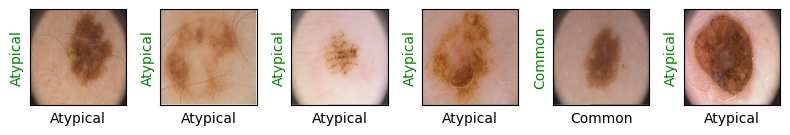

Training Loss: 0.1775
Starting epoch 7/50
Evaluating at step 0
Validation Loss: 0.0894, Accuracy: 0.9667


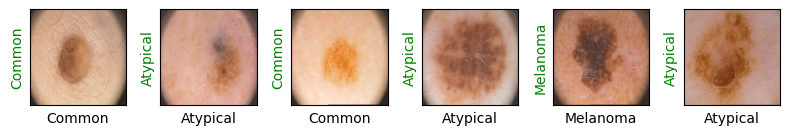

Evaluating at step 20
Validation Loss: 0.0407, Accuracy: 1.0000


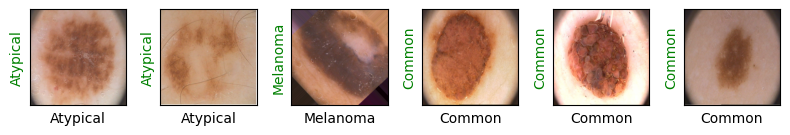

Training Loss: 0.2506
Starting epoch 8/50
Evaluating at step 0
Validation Loss: 0.1143, Accuracy: 0.9333


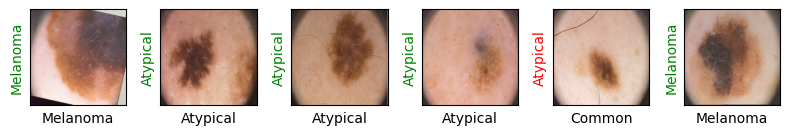

Evaluating at step 20
Validation Loss: 0.1729, Accuracy: 0.9333


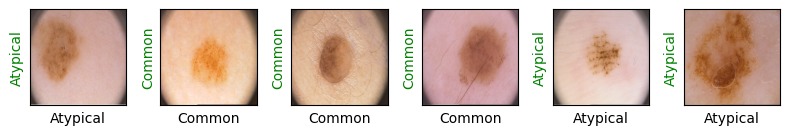

Training Loss: 0.1650
Starting epoch 9/50
Evaluating at step 0
Validation Loss: 0.0517, Accuracy: 0.9667


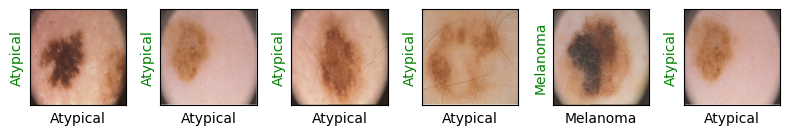

Evaluating at step 20
Validation Loss: 0.0770, Accuracy: 1.0000


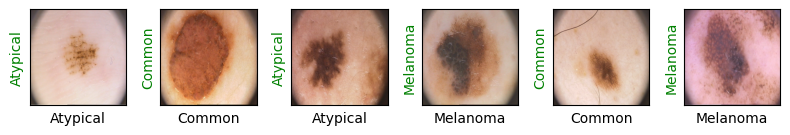

Training Loss: 0.1426
Starting epoch 10/50
Evaluating at step 0
Validation Loss: 0.0183, Accuracy: 1.0000


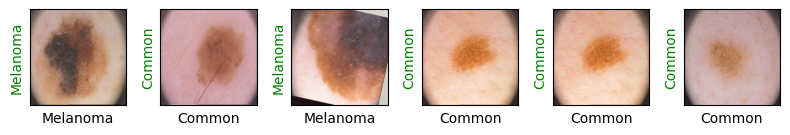

Evaluating at step 20
Validation Loss: 0.0219, Accuracy: 1.0000


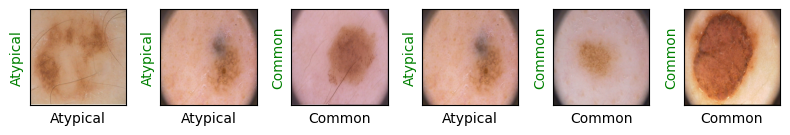

Training Loss: 0.0807
Starting epoch 11/50
Evaluating at step 0
Validation Loss: 0.0073, Accuracy: 1.0000


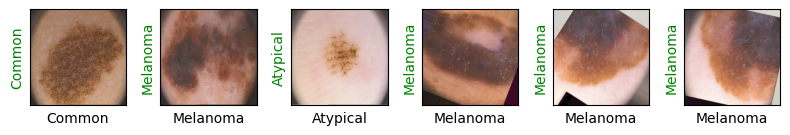

Evaluating at step 20
Validation Loss: 0.0231, Accuracy: 1.0000


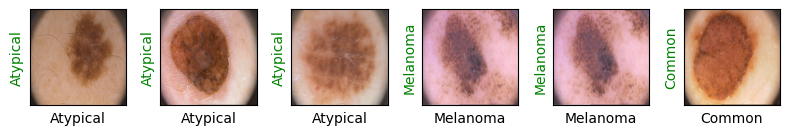

Training Loss: 0.0840
Starting epoch 12/50
Evaluating at step 0
Validation Loss: 0.0115, Accuracy: 1.0000


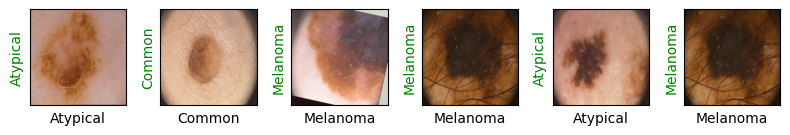

Evaluating at step 20
Validation Loss: 0.0165, Accuracy: 1.0000


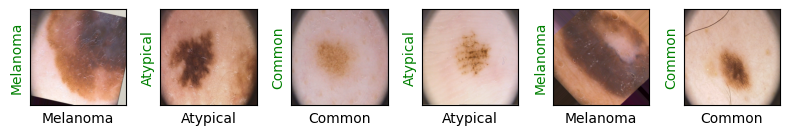

Training Loss: 0.1023
Starting epoch 13/50
Evaluating at step 0
Validation Loss: 0.0053, Accuracy: 1.0000


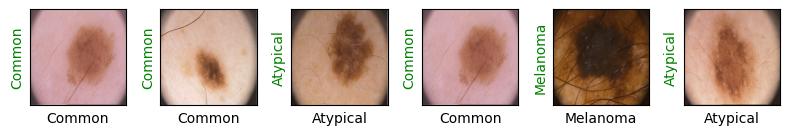

Evaluating at step 20
Validation Loss: 0.0090, Accuracy: 1.0000


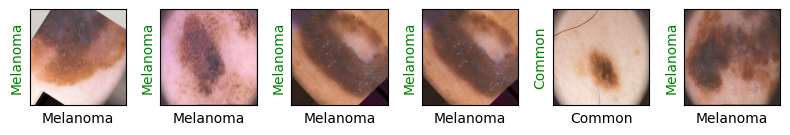

Training Loss: 0.0725
Starting epoch 14/50
Evaluating at step 0
Validation Loss: 0.0069, Accuracy: 1.0000


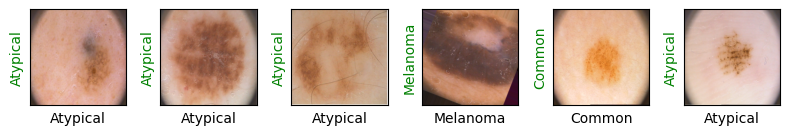

Evaluating at step 20
Validation Loss: 0.0059, Accuracy: 1.0000


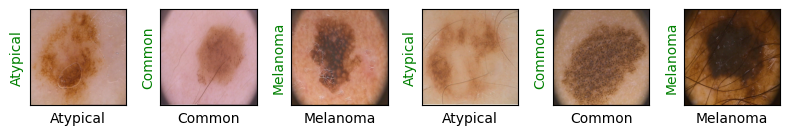

Training Loss: 0.0984
Starting epoch 15/50
Evaluating at step 0
Validation Loss: 0.0214, Accuracy: 1.0000


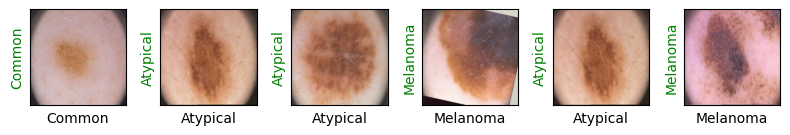

Evaluating at step 20
Validation Loss: 0.0090, Accuracy: 1.0000


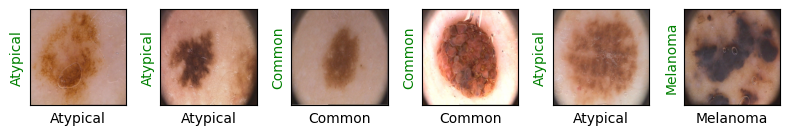

Training Loss: 0.1180
Starting epoch 16/50
Evaluating at step 0
Validation Loss: 0.0070, Accuracy: 1.0000


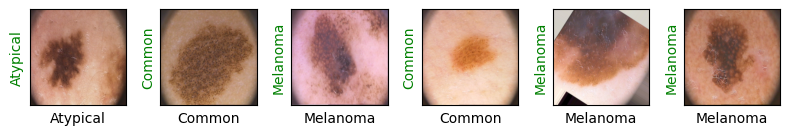

Evaluating at step 20
Validation Loss: 0.0108, Accuracy: 1.0000


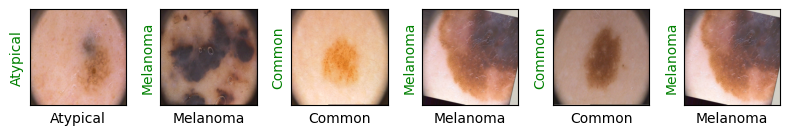

Training Loss: 0.0532
Starting epoch 17/50
Evaluating at step 0
Validation Loss: 0.0029, Accuracy: 1.0000


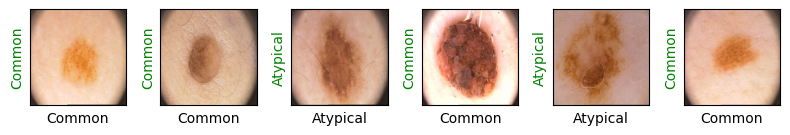

Evaluating at step 20
Validation Loss: 0.0048, Accuracy: 1.0000


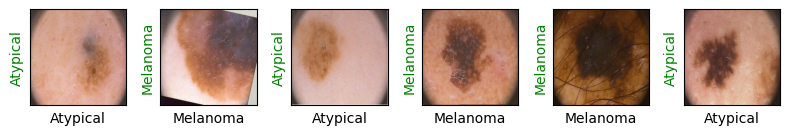

Training Loss: 0.0887
Starting epoch 18/50
Evaluating at step 0
Validation Loss: 0.0035, Accuracy: 1.0000


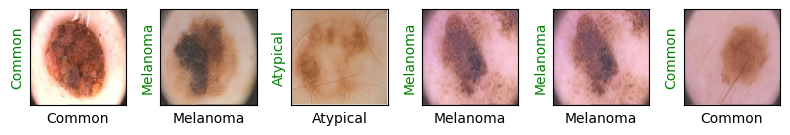

Evaluating at step 20
Validation Loss: 0.0037, Accuracy: 1.0000


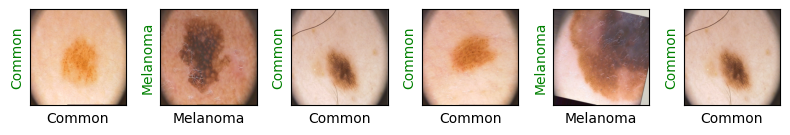

Training Loss: 0.0794
Starting epoch 19/50
Evaluating at step 0
Validation Loss: 0.0043, Accuracy: 1.0000


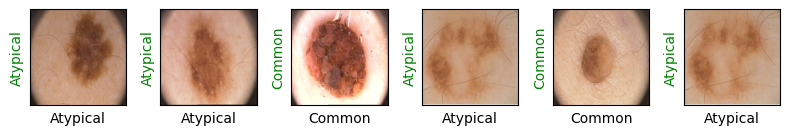

Evaluating at step 20
Validation Loss: 0.0024, Accuracy: 1.0000


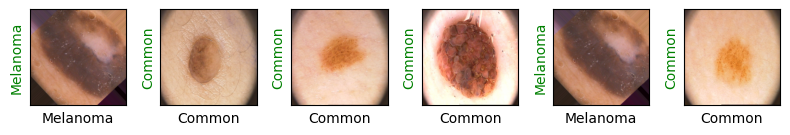

Training Loss: 0.0477
Starting epoch 20/50
Evaluating at step 0
Validation Loss: 0.0024, Accuracy: 1.0000


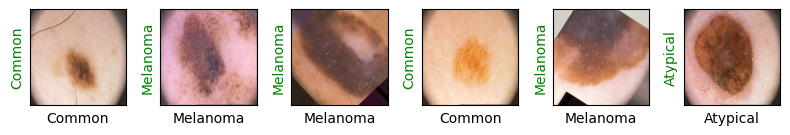

Evaluating at step 20
Validation Loss: 0.0016, Accuracy: 1.0000


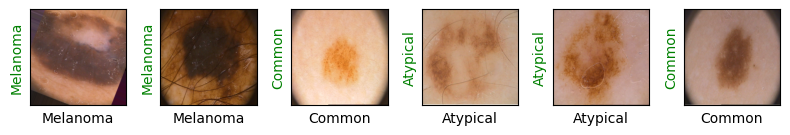

Training Loss: 0.0422
Starting epoch 21/50
Evaluating at step 0
Validation Loss: 0.0020, Accuracy: 1.0000


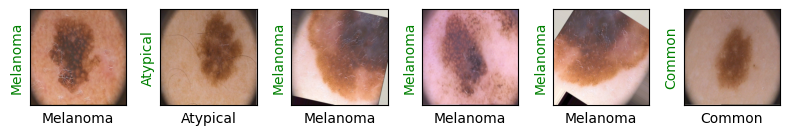

Evaluating at step 20
Validation Loss: 0.0020, Accuracy: 1.0000


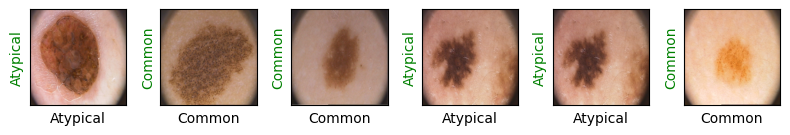

Training Loss: 0.0911
Starting epoch 22/50
Evaluating at step 0
Validation Loss: 0.0017, Accuracy: 1.0000


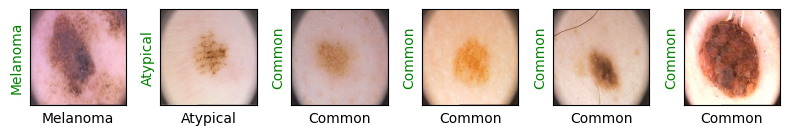

Evaluating at step 20
Validation Loss: 0.0045, Accuracy: 1.0000


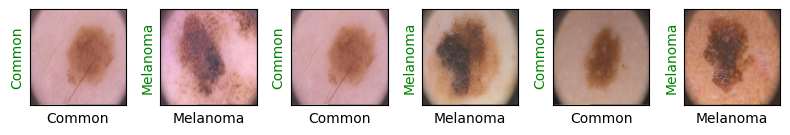

Training Loss: 0.1025
Starting epoch 23/50
Evaluating at step 0
Validation Loss: 0.0036, Accuracy: 1.0000


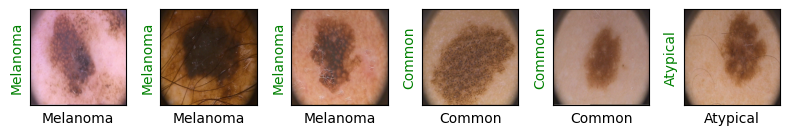

Evaluating at step 20
Validation Loss: 0.0038, Accuracy: 1.0000


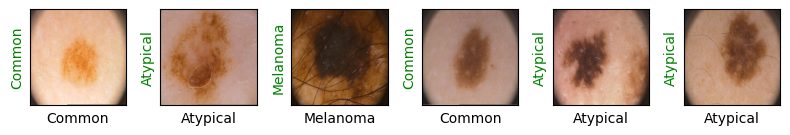

Training Loss: 0.0557
Starting epoch 24/50
Evaluating at step 0
Validation Loss: 0.0051, Accuracy: 1.0000


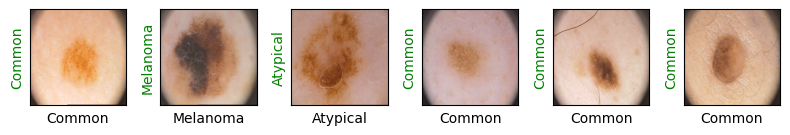

Evaluating at step 20
Validation Loss: 0.0034, Accuracy: 1.0000


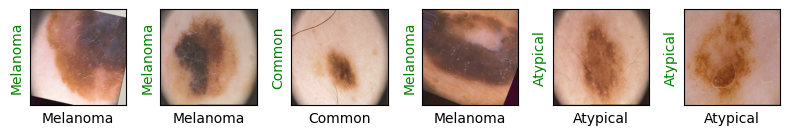

Training Loss: 0.0579
Starting epoch 25/50
Evaluating at step 0
Validation Loss: 0.0024, Accuracy: 1.0000


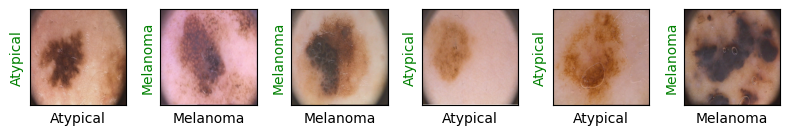

Evaluating at step 20
Validation Loss: 0.0038, Accuracy: 1.0000


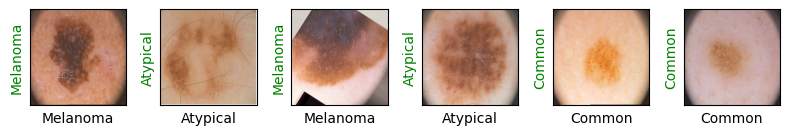

Training Loss: 0.1329
Starting epoch 26/50
Evaluating at step 0
Validation Loss: 0.0027, Accuracy: 1.0000


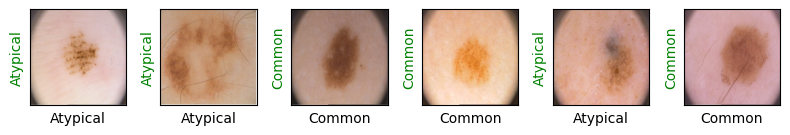

Evaluating at step 20
Validation Loss: 0.0060, Accuracy: 1.0000


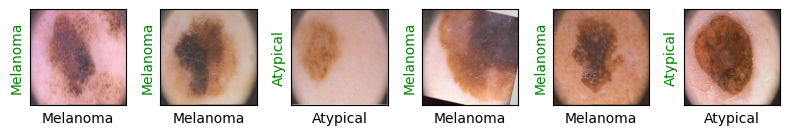

Training Loss: 0.1492
Starting epoch 27/50
Evaluating at step 0
Validation Loss: 0.0048, Accuracy: 1.0000


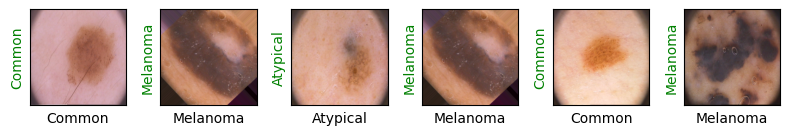

Evaluating at step 20
Validation Loss: 0.0034, Accuracy: 1.0000


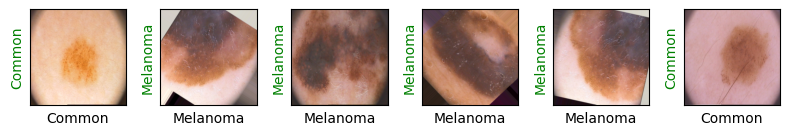

Training Loss: 0.0628
Starting epoch 28/50
Evaluating at step 0
Validation Loss: 0.0047, Accuracy: 1.0000


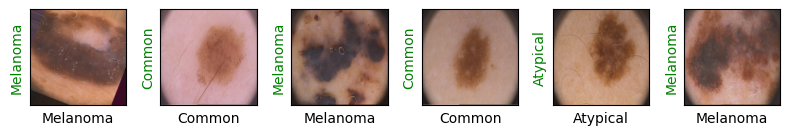

Evaluating at step 20
Validation Loss: 0.0023, Accuracy: 1.0000


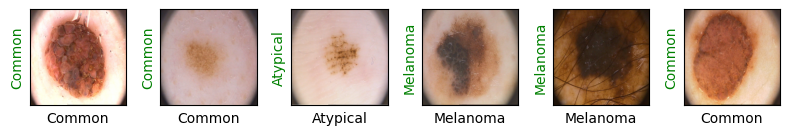

Training Loss: 0.0983
Starting epoch 29/50
Evaluating at step 0
Validation Loss: 0.0069, Accuracy: 1.0000


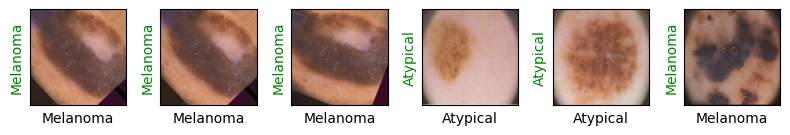

Evaluating at step 20
Validation Loss: 0.0049, Accuracy: 1.0000


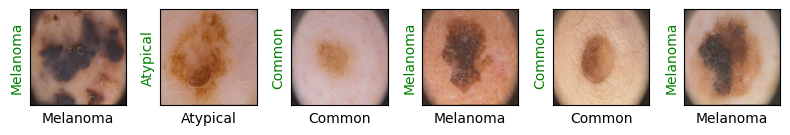

Training Loss: 0.0652
Starting epoch 30/50
Evaluating at step 0
Validation Loss: 0.0034, Accuracy: 1.0000


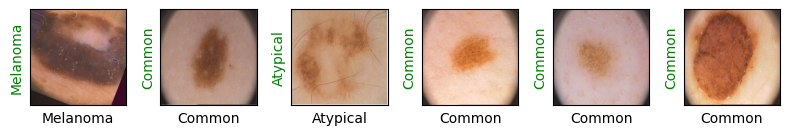

Evaluating at step 20
Validation Loss: 0.0036, Accuracy: 1.0000


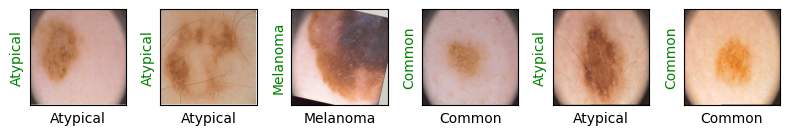

Training Loss: 0.0627
Starting epoch 31/50
Evaluating at step 0
Validation Loss: 0.0092, Accuracy: 1.0000


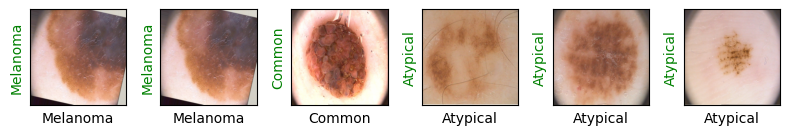

Evaluating at step 20
Validation Loss: 0.0069, Accuracy: 1.0000


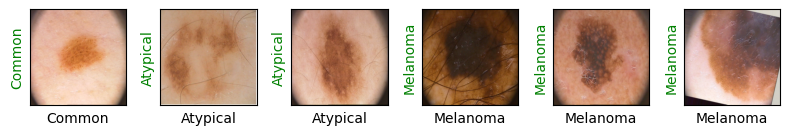

Training Loss: 0.0436
Starting epoch 32/50
Evaluating at step 0
Validation Loss: 0.0029, Accuracy: 1.0000


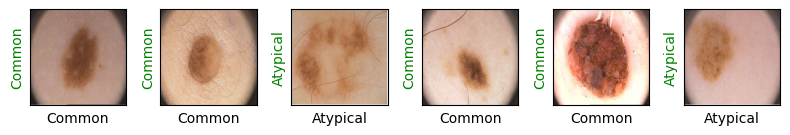

Evaluating at step 20
Validation Loss: 0.0030, Accuracy: 1.0000


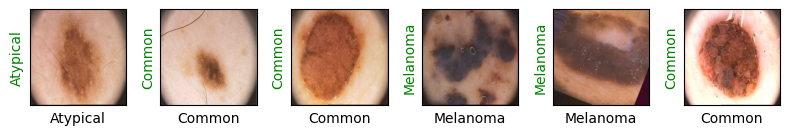

Training Loss: 0.0315
Starting epoch 33/50
Evaluating at step 0
Validation Loss: 0.0026, Accuracy: 1.0000


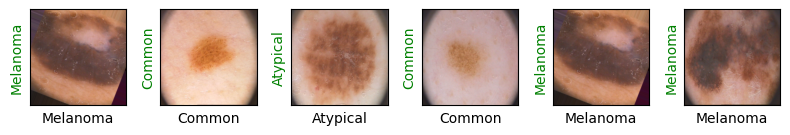

Evaluating at step 20
Validation Loss: 0.0029, Accuracy: 1.0000


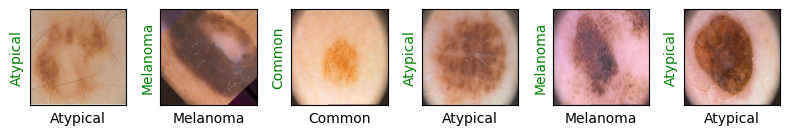

Training Loss: 0.0515
Starting epoch 34/50
Evaluating at step 0
Validation Loss: 0.0011, Accuracy: 1.0000


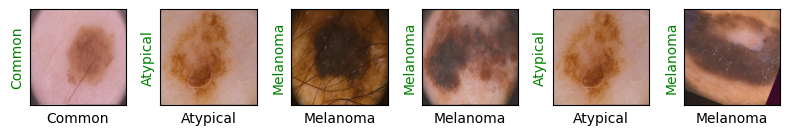

Evaluating at step 20
Validation Loss: 0.0015, Accuracy: 1.0000


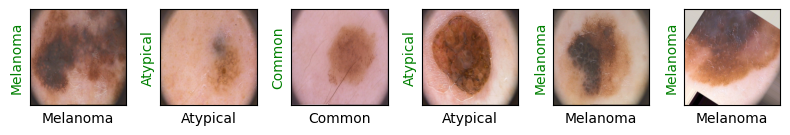

Training Loss: 0.0769
Starting epoch 35/50
Evaluating at step 0
Validation Loss: 0.0015, Accuracy: 1.0000


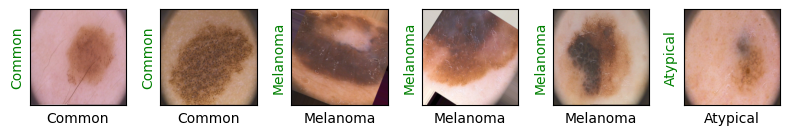

Evaluating at step 20
Validation Loss: 0.0032, Accuracy: 1.0000


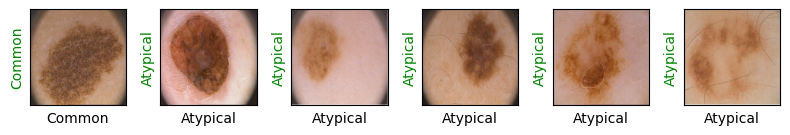

Training Loss: 0.0292
Starting epoch 36/50
Evaluating at step 0
Validation Loss: 0.0020, Accuracy: 1.0000


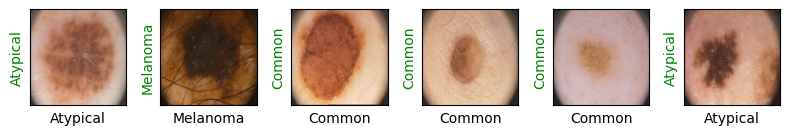

Evaluating at step 20
Validation Loss: 0.0027, Accuracy: 1.0000


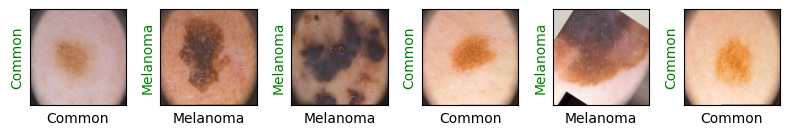

Training Loss: 0.0624
Starting epoch 37/50
Evaluating at step 0
Validation Loss: 0.0018, Accuracy: 1.0000


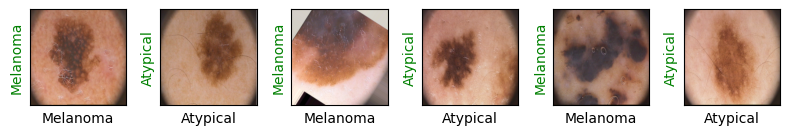

Evaluating at step 20
Validation Loss: 0.0022, Accuracy: 1.0000


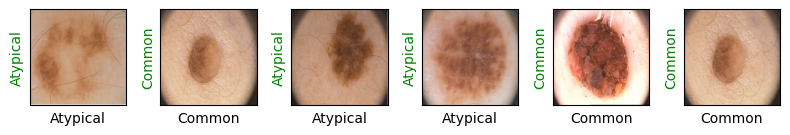

Training Loss: 0.0267
Starting epoch 38/50
Evaluating at step 0
Validation Loss: 0.0018, Accuracy: 1.0000


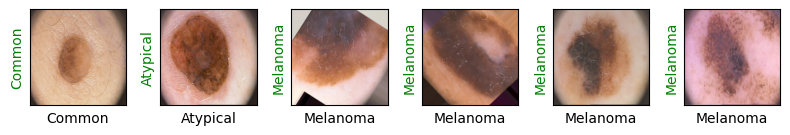

Evaluating at step 20
Validation Loss: 0.0016, Accuracy: 1.0000


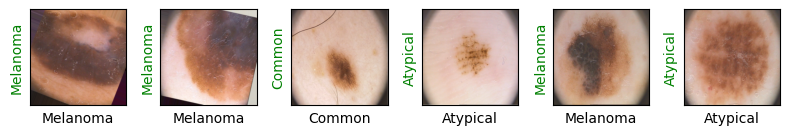

Training Loss: 0.0660
Starting epoch 39/50
Evaluating at step 0
Validation Loss: 0.0015, Accuracy: 1.0000


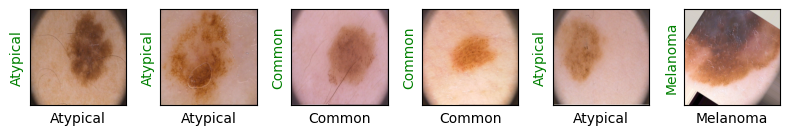

Evaluating at step 20
Validation Loss: 0.0019, Accuracy: 1.0000


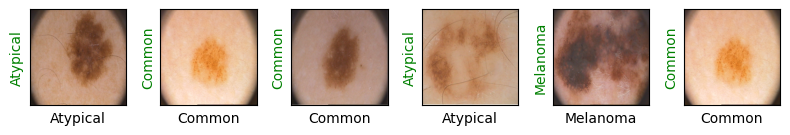

Training Loss: 0.1266
Starting epoch 40/50
Evaluating at step 0
Validation Loss: 0.0039, Accuracy: 1.0000


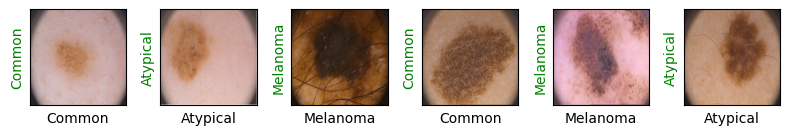

Evaluating at step 20
Validation Loss: 0.0044, Accuracy: 1.0000


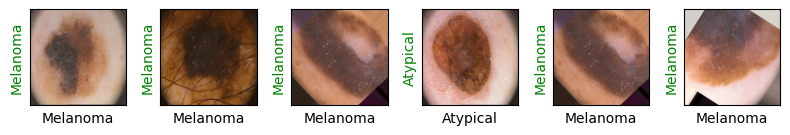

Training Loss: 0.0484
Starting epoch 41/50
Evaluating at step 0
Validation Loss: 0.0030, Accuracy: 1.0000


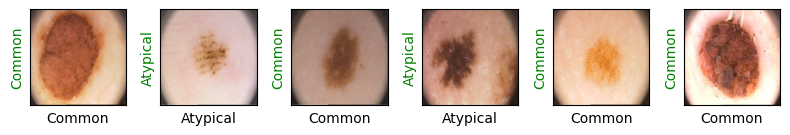

Evaluating at step 20
Validation Loss: 0.0028, Accuracy: 1.0000


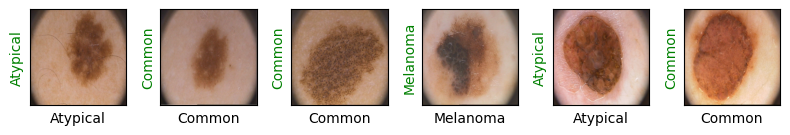

Training Loss: 0.0172
Starting epoch 42/50
Evaluating at step 0
Validation Loss: 0.0021, Accuracy: 1.0000


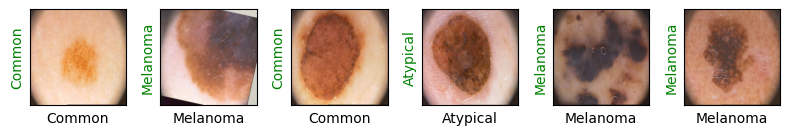

Evaluating at step 20
Validation Loss: 0.0019, Accuracy: 1.0000


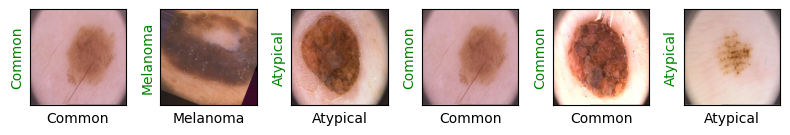

Training Loss: 0.0288
Starting epoch 43/50
Evaluating at step 0
Validation Loss: 0.0012, Accuracy: 1.0000


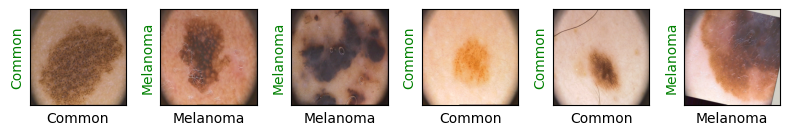

Evaluating at step 20
Validation Loss: 0.0013, Accuracy: 1.0000


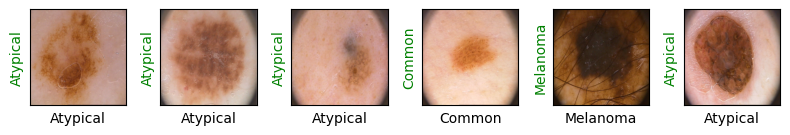

Training Loss: 0.0547
Starting epoch 44/50
Evaluating at step 0
Validation Loss: 0.0022, Accuracy: 1.0000


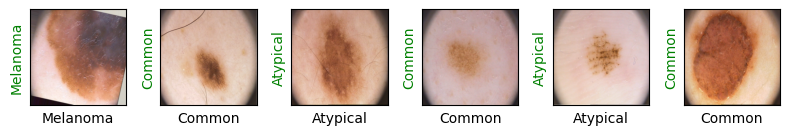

Evaluating at step 20
Validation Loss: 0.0020, Accuracy: 1.0000


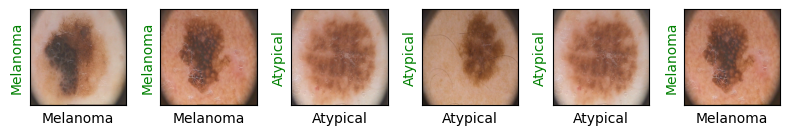

Training Loss: 0.0354
Starting epoch 45/50
Evaluating at step 0
Validation Loss: 0.0015, Accuracy: 1.0000


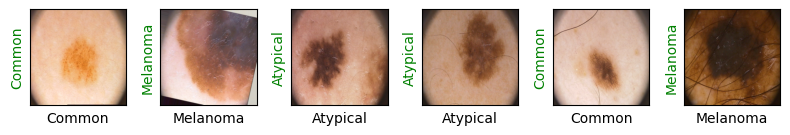

Evaluating at step 20
Validation Loss: 0.0015, Accuracy: 1.0000


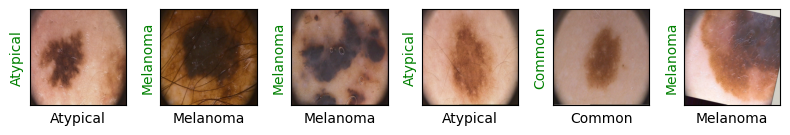

Training Loss: 0.0181
Starting epoch 46/50
Evaluating at step 0
Validation Loss: 0.0013, Accuracy: 1.0000


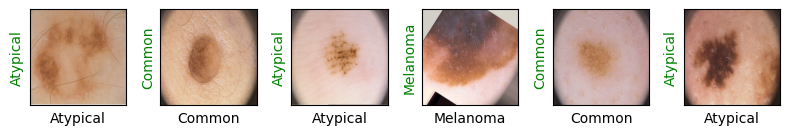

Evaluating at step 20
Validation Loss: 0.0011, Accuracy: 1.0000


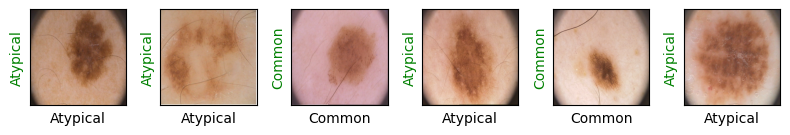

Training Loss: 0.0391
Starting epoch 47/50
Evaluating at step 0
Validation Loss: 0.0007, Accuracy: 1.0000


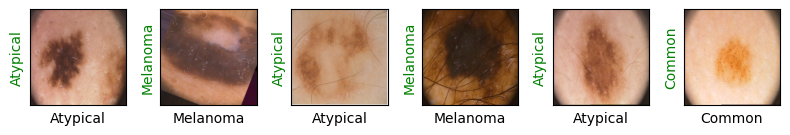

Evaluating at step 20
Validation Loss: 0.0009, Accuracy: 1.0000


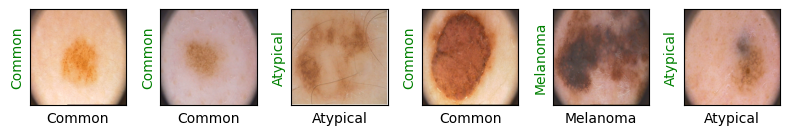

Training Loss: 0.0177
Starting epoch 48/50
Evaluating at step 0
Validation Loss: 0.0015, Accuracy: 1.0000


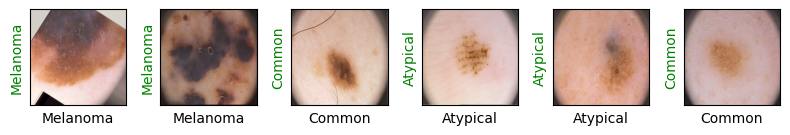

Evaluating at step 20
Validation Loss: 0.0016, Accuracy: 1.0000


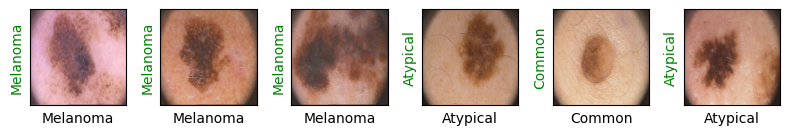

Training Loss: 0.0202
Starting epoch 49/50
Evaluating at step 0
Validation Loss: 0.0008, Accuracy: 1.0000


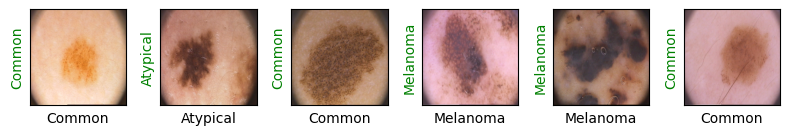

Evaluating at step 20
Validation Loss: 0.0010, Accuracy: 1.0000


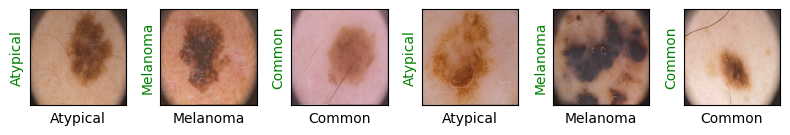

Training Loss: 0.0213
Starting epoch 50/50
Evaluating at step 0
Validation Loss: 0.0005, Accuracy: 1.0000


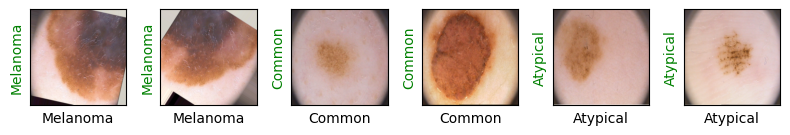

Evaluating at step 20
Validation Loss: 0.0010, Accuracy: 1.0000


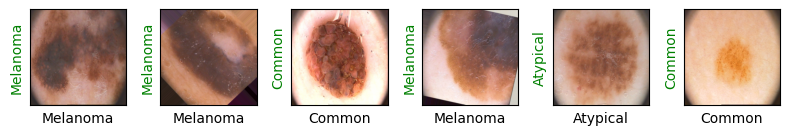

Training Loss: 0.0229
Training complete..


In [47]:
train(epochs=50)

# Final Results

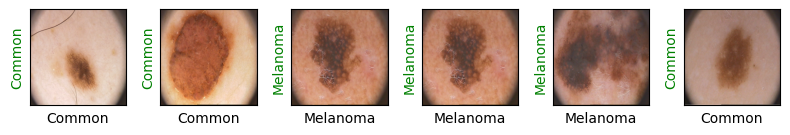

In [48]:
show_preds()